**IMPORTATION DES LIBRAIRIES**

In [1]:
#import

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import regex as re


In [2]:
pd.set_option("display.max_columns", 10000)

In [3]:
#dll

**COLLECT**

In [4]:
df =pd.read_csv("liste-des-immeubles-proteges-au-titre-des-monuments-historiques.csv",sep=";")

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/3335856257.py:1: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  df =pd.read_csv("liste-des-immeubles-proteges-au-titre-des-monuments-historiques.csv",sep=";")


**STATISTIQUE DESCRIPTIVES**

In [5]:
df.head()
#df.info()
#df.describe()
#df.isna().sum()
#df.shape
#df.nunique()
#df.isna().sum()
#autre chose ?

,commune,code_departement,dmaj,insee,region,departement,commune_1,appellation_courante,adresse_1,siecle,date_de_protection,precision_sur_la_protection,auteur,statut,description,historique,affectataire,adresse,ancienne_region,reference,contact,longitude,latitude,coordonnees,coordonnees_ban,coordonnees_finales
0,Hautot-sur-Seine,76,2020-11-17,76350,Normandie,Seine-Maritime,Hautot-sur-Seine,Cimetière,NaN,16e siècle;18e siècle,1935/03/04 : classé MH,Chapelle : classement par arrêté du 4 mars 1935,NaN,propriété de la commune,NaN,NaN,NaN,NaN,Anciennement région de : Haute-Normandie,PA00100693,mediatheque.patrimoine@culture.gouv.fr,NaN,NaN,NaN,"49.364138, 0.975076","49.364138,0.975076"
1,Havre (Le),76,2020-11-17,76351,Normandie,Seine-Maritime,Le Havre,Maison Dubocage de Bliville (ou maison des Veu...,"1, 3 rue Jérôme-Bellamarto",16e siècle;17e siècle,1946/10/04 : inscrit MH,Façades et toitures : inscription par arrêté d...,NaN,propriété de la commune,NaN,NaN,NaN,"Jérôme-Bellamarto (rue) 1, 3",Anciennement région de : Haute-Normandie,PA00100714,mediatheque.patrimoine@culture.gouv.fr,NaN,NaN,NaN,"49.4891, 0.114677","49.4891,0.114677"
2,Mesnières-en-Bray,76,2021-02-02,76427,Normandie,Seine-Maritime,Mesnières-en-Bray,Domaine de Mesnières,NaN,1ère moitié 16e siècle;3e quart 17e siècle;18e...,1862 : classé MH ; 1995/10/12 : classé MH,Château : classement par liste de 1862. Enclos...,NaN,propriété d'une association,NaN,"Le château a été commencé vers 1500, et achevé...",NaN,NaN,Anciennement région de : Haute-Normandie,PA00100751,mediatheque.patrimoine@culture.gouv.fr,1.38198306413654,49.762229,"49.7622285516, 1.38198306414","49.761747, 1.379213","49.7622285516,1.38198306414"
3,Neuville-Chant-d'Oisel (La),76,2021-02-02,76464,Normandie,Seine-Maritime,La Neuville-Chant-d'Oisel,Eglise,NaN,NaN,1926/11/24 : inscrit MH,Arcades de la nef : inscription par arrêté du ...,NaN,propriété de la commune,NaN,NaN,NaN,NaN,Anciennement région de : Haute-Normandie,PA00100772,mediatheque.patrimoine@culture.gouv.fr,1.23200108687225,49.372369,"49.3723693598, 1.23200108687","49.366535, 1.244735","49.3723693598,1.23200108687"
4,Pavilly,76,2020-11-17,76495,Normandie,Seine-Maritime,Pavilly,Château d'Esneval,NaN,3e quart 18e siècle,1970/03/02 : classé MH,"Chapelle ; corps de bâtiment attenant au nord,...",NaN,propriété privée,NaN,NaN,NaN,NaN,Anciennement région de : Haute-Normandie,PA00100791,mediatheque.patrimoine@culture.gouv.fr,NaN,NaN,NaN,"49.577214, 0.944576","49.577214,0.944576"


In [6]:
#visuel

def stat_desc_comparaison(data1, nom_data1): 
   
        ## PARTIE VARIABLES QUALITATIVES ##
    print("VARIABLES QUALITATIVES : ")
    print('------------------------------------------------------------------------------------------------')
    for col in data1.select_dtypes(include='object').columns:

        if(len(data1[col].value_counts())>100):
            print("La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : "
             + str(col))
        else:

            # Creation des value_counts
            table_to_plot1 = pd.DataFrame(data1[col].value_counts(normalize=True)*100)
            table_to_plot1['Nom_label'] = table_to_plot1.index

            fig = px.pie(table_to_plot1, values=col, names='Nom_label')

            # Tune layout and hover info
            fig.update_traces(hoverinfo='label+percent+name', textinfo='none')
            fig.update(layout_title_text='Répartition de la variable :  '+ col,
                       layout_showlegend=False)

            fig = go.Figure(fig)
            fig.show()
    #         return(fig.show())
    
    ## PARTIE QUANTITATIVE ## 
    print("VARIABLES QUANTITATIVES : ")
    print('------------------------------------------------------------------------------------------------')
    for col in data1.select_dtypes(include=np.number).columns:
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=data1[col], name=nom_data1))

        # Overlay both histograms
        fig.update_layout(barmode='overlay')
        # title
        fig.update(layout_title_text='Histogrammes de la variable :  '+ col)
        # Reduce opacity to see both histograms
        fig.update_traces(opacity=0.75)
        fig.show()

In [7]:
stat_desc_comparaison(df,'Monument')

VARIABLES QUALITATIVES : 
------------------------------------------------------------------------------------------------
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : commune
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : code_departement
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : dmaj
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : insee


La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : departement
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : commune_1
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : appellation_courante
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : adresse_1
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : siecle
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : date_de_protection
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : precision_sur_la_protection
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : auteur
La variables qualitative a un 

La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : longitude
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : coordonnees
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : coordonnees_ban
La variables qualitative a un nombre trop important de valeurs différentes et a été écartée de l'analyse : coordonnees_finales
VARIABLES QUANTITATIVES : 
------------------------------------------------------------------------------------------------


In [8]:
#pour des variables qui m'intéressent je regarde dans le détail :

df['appellation_courante'].value_counts()

Maison                                                                                     2942
Eglise                                                                                     2626
Immeuble                                                                                   2307
Château                                                                                    1195
Eglise Saint-Martin                                                                         466
                                                                                           ... 
Eglise Notre-Dame de l'Assomption de la Chapelle-sur-Crécy                                    1
Ferme de Lamirault (également sur commune de Croissy-Beaubourg)                               1
Immeuble, actuellement musée Georges Clemenceau                                               1
Hôtel de Ribault ou de Langres (ancien) (voir aussi : Synagogue, 21 rue des Tournelles)       1
Château de Ville-sur-Saulx (également su

**FEATURING**


In [9]:
#f = df.drop('siecle',axis=1)
#df.set_index('Référence') Réference n'existe plus en 2022

In [10]:
colonnes_a_supprimer = []
colonnes_a_dumifier = []
colonnes_a_vectoriser = []
colonnes_a_conserver =[]
for column in df :
    if column in ['siecle','Siecle_format_brut','coordonnees_finales']:
      colonnes_a_conserver.append(column)  
    elif column in ['adresse', 'contact','adresse1', 'coordonnees','commune','insee', 'commune_1','dmaj','ancienne_region','Commune1','coordonnees_ban','Référence','date_de_protection','precision_sur_la_protection', 'statut', 'reference', 'longitude', 'latitude']:
      colonnes_a_supprimer.append(column)
    elif df[column].isna().sum() > 0.8*df[column].count() :
      colonnes_a_supprimer.append(column)
    elif df[column].nunique()<2:
      colonnes_a_supprimer.append(column)    
    elif df[column].nunique()<25:
      colonnes_a_dumifier.append(column)
    elif df[column].nunique() >24:
      colonnes_a_vectoriser.append(column)
    else:
      colonnes_a_vectoriser.append(column) 


print(colonnes_a_supprimer)
print(colonnes_a_conserver)
print(colonnes_a_dumifier)
print(colonnes_a_vectoriser)

['commune', 'dmaj', 'insee', 'commune_1', 'adresse_1', 'date_de_protection', 'precision_sur_la_protection', 'auteur', 'statut', 'description', 'historique', 'affectataire', 'adresse', 'ancienne_region', 'reference', 'contact', 'longitude', 'latitude', 'coordonnees', 'coordonnees_ban']
['siecle', 'coordonnees_finales']
['region']
['code_departement', 'departement', 'appellation_courante']


In [11]:
df2 = df.drop(colonnes_a_supprimer, axis=1)


In [12]:
df2

,code_departement,region,departement,appellation_courante,siecle,coordonnees_finales
0,76,Normandie,Seine-Maritime,Cimetière,16e siècle;18e siècle,"49.364138,0.975076"
1,76,Normandie,Seine-Maritime,Maison Dubocage de Bliville (ou maison des Veu...,16e siècle;17e siècle,"49.4891,0.114677"
2,76,Normandie,Seine-Maritime,Domaine de Mesnières,1ère moitié 16e siècle;3e quart 17e siècle;18e...,"49.7622285516,1.38198306414"
3,76,Normandie,Seine-Maritime,Eglise,NaN,"49.3723693598,1.23200108687"
4,76,Normandie,Seine-Maritime,Château d'Esneval,3e quart 18e siècle,"49.577214,0.944576"
...,...,...,...,...,...,...
45902,68,Grand Est,Haut-Rhin,Enceinte fortifiée,12e siècle;13e siècle,"47.9609758801,7.29859373247"
45903,67,Grand Est,Bas-Rhin,Maison,NaN,"48.578661245,7.74948753747"
45904,68,Grand Est,Haut-Rhin,Eglise catholique Saint-Louis,2e quart 18e siècle,"48.0186128108,7.52882380615"
45905,76,Normandie,Seine-Maritime,"Maison de Pierre Corneille, actuellement Musée...",17e siècle,"49.3889811354,1.02145033662"


In [13]:
#code simple si nom voulons traiter les appelation courante sans acm
df2['Appellation courante1'] = df2['appellation_courante'].str.split().str.get(0)
df2_group = df2.groupby('Appellation courante1').count().sort_values(by=['code_departement'], ascending=False)
pour_comptage = df2_group[:15].index.tolist()[0:15]
for line in pour_comptage:
  df2['IS_'+line] = 0
  df2['IS_'+line][df2['appellation_courante'].str.contains(line, na=False)] = 1

#On traite les siecles
df2['siecle_0'] = df2['siecle'].apply(lambda x : re.findall('(\d*)..siècle', str(x)))
df2['siecle_min'] = df2['siecle_0'].apply(lambda x : min(x) if x else None)


#on traite les régions 
DomTom = ['La Réunion', 'Guadeloupe', 'Martinique', 'Guyane', 'Saint-Pierre-et-Miquelon', 'Mayotte']
df2['region'] = df2['region'].apply(lambda x: 'dom' if x in DomTom else x.lower().strip())
df2 = df2[df2.region != 'Auvergne-Rhône-Alpes;Bourgogne-Franche-Comté']
#test= pd.get_dummies(df2['region'])
#df2 = pd.concat([df2, test], axis=1, join="inner")

#on traite les coordonnées 
df2['longitude']=df2['coordonnees_finales'].apply(lambda x : float(str(x).split(',')[0]))
df2['latitude']=df2['coordonnees_finales'].apply(lambda x : float(str(x).split(',')[-1]))
df2.drop(['coordonnees_finales'], axis=1)

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/2571300833.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/2571300833.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/2571300833.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel

,code_departement,region,departement,appellation_courante,siecle,Appellation courante1,IS_Eglise,IS_Maison,IS_Château,IS_Immeuble,IS_Ancien,IS_Hôtel,IS_Ancienne,IS_Chapelle,IS_Croix,IS_Manoir,IS_Domaine,IS_Dolmen,IS_Fontaine,IS_Tour,IS_Pont,siecle_0,siecle_min,longitude,latitude
0,76,normandie,Seine-Maritime,Cimetière,16e siècle;18e siècle,Cimetière,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 18]",16,49.364138,0.975076
1,76,normandie,Seine-Maritime,Maison Dubocage de Bliville (ou maison des Veu...,16e siècle;17e siècle,Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 17]",16,49.489100,0.114677
2,76,normandie,Seine-Maritime,Domaine de Mesnières,1ère moitié 16e siècle;3e quart 17e siècle;18e...,Domaine,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,"[16, 17, 18, 19]",16,49.762229,1.381983
3,76,normandie,Seine-Maritime,Eglise,NaN,Eglise,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[],None,49.372369,1.232001
4,76,normandie,Seine-Maritime,Château d'Esneval,3e quart 18e siècle,Château,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,[18],18,49.577214,0.944576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45902,68,grand est,Haut-Rhin,Enceinte fortifiée,12e siècle;13e siècle,Enceinte,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[12, 13]",12,47.960976,7.298594
45903,67,grand est,Bas-Rhin,Maison,NaN,Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,[],None,48.578661,7.749488
45904,68,grand est,Haut-Rhin,Eglise catholique Saint-Louis,2e quart 18e siècle,Eglise,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[18],18,48.018613,7.528824
45905,76,normandie,Seine-Maritime,"Maison de Pierre Corneille, actuellement Musée...",17e siècle,Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,[17],17,49.388981,1.021450


In [14]:
#Dummies
df_dummies= pd.get_dummies(df2, prefix=colonnes_a_dumifier, columns=colonnes_a_dumifier)
df_dummies.head()

,code_departement,departement,appellation_courante,siecle,coordonnees_finales,Appellation courante1,IS_Eglise,IS_Maison,IS_Château,IS_Immeuble,IS_Ancien,IS_Hôtel,IS_Ancienne,IS_Chapelle,IS_Croix,IS_Manoir,IS_Domaine,IS_Dolmen,IS_Fontaine,IS_Tour,IS_Pont,siecle_0,siecle_min,longitude,latitude,region_auvergne-rhône-alpes,region_auvergne-rhône-alpes;bourgogne-franche-comté,region_bourgogne-franche-comté,region_bretagne,region_centre-val de loire,region_corse,region_dom,region_grand est,region_hauts-de-france,region_normandie,region_nouvelle-aquitaine,region_occitanie,region_pays de la loire,region_provence-alpes-côte d'azur,region_île-de-france
0,76,Seine-Maritime,Cimetière,16e siècle;18e siècle,"49.364138,0.975076",Cimetière,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 18]",16,49.364138,0.975076,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,76,Seine-Maritime,Maison Dubocage de Bliville (ou maison des Veu...,16e siècle;17e siècle,"49.4891,0.114677",Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 17]",16,49.489100,0.114677,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,76,Seine-Maritime,Domaine de Mesnières,1ère moitié 16e siècle;3e quart 17e siècle;18e...,"49.7622285516,1.38198306414",Domaine,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,"[16, 17, 18, 19]",16,49.762229,1.381983,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,76,Seine-Maritime,Eglise,NaN,"49.3723693598,1.23200108687",Eglise,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[],None,49.372369,1.232001,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,76,Seine-Maritime,Château d'Esneval,3e quart 18e siècle,"49.577214,0.944576",Château,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,[18],18,49.577214,0.944576,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [15]:
df2.columns

Index(['code_departement', 'region', 'departement', 'appellation_courante',
       'siecle', 'coordonnees_finales', 'Appellation courante1', 'IS_Eglise',
       'IS_Maison', 'IS_Château', 'IS_Immeuble', 'IS_Ancien', 'IS_Hôtel',
       'IS_Ancienne', 'IS_Chapelle', 'IS_Croix', 'IS_Manoir', 'IS_Domaine',
       'IS_Dolmen', 'IS_Fontaine', 'IS_Tour', 'IS_Pont', 'siecle_0',
       'siecle_min', 'longitude', 'latitude'],
      dtype='object')

In [16]:
#pip install fanalysis

In [17]:
#ou alors faire une ACM / ACP etc

from fanalysis.mca import MCA
colonnes_mca =['region','Appellation courante1']
X = df2[['region','Appellation courante1']].values 
print(X)
lamca = MCA(row_labels=df.index.values,n_components=3)
lamca.fit(X)
df_rows = lamca.row_topandas()


[['normandie' 'Cimetière']
 ['normandie' 'Maison']
 ['normandie' 'Domaine']
 ...
 ['grand est' 'Eglise']
 ['normandie' 'Maison']
 ['grand est' 'Château']]


In [18]:
df_concat=df_rows.iloc[:, 0:3]
df_concat

,row_coord_dim1,row_coord_dim2,row_coord_dim3
0,-0.107845,0.743573,0.840299
1,-0.125676,0.450090,0.108011
2,-0.005716,0.042256,0.385311
3,-0.182350,0.251131,0.038109
4,-0.242279,0.410048,-0.036582
...,...,...,...
45902,-0.147419,-0.518802,0.092110
45903,-0.069514,-0.043181,-0.195119
45904,-0.126188,-0.242139,-0.265020
45905,-0.125676,0.450090,0.108011


In [19]:
df_final = pd.concat([df2, df_concat], axis=1, join="inner")

In [20]:
df_final

,code_departement,region,departement,appellation_courante,siecle,coordonnees_finales,Appellation courante1,IS_Eglise,IS_Maison,IS_Château,IS_Immeuble,IS_Ancien,IS_Hôtel,IS_Ancienne,IS_Chapelle,IS_Croix,IS_Manoir,IS_Domaine,IS_Dolmen,IS_Fontaine,IS_Tour,IS_Pont,siecle_0,siecle_min,longitude,latitude,row_coord_dim1,row_coord_dim2,row_coord_dim3
0,76,normandie,Seine-Maritime,Cimetière,16e siècle;18e siècle,"49.364138,0.975076",Cimetière,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 18]",16,49.364138,0.975076,-0.107845,0.743573,0.840299
1,76,normandie,Seine-Maritime,Maison Dubocage de Bliville (ou maison des Veu...,16e siècle;17e siècle,"49.4891,0.114677",Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,"[16, 17]",16,49.489100,0.114677,-0.125676,0.450090,0.108011
2,76,normandie,Seine-Maritime,Domaine de Mesnières,1ère moitié 16e siècle;3e quart 17e siècle;18e...,"49.7622285516,1.38198306414",Domaine,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,"[16, 17, 18, 19]",16,49.762229,1.381983,-0.005716,0.042256,0.385311
3,76,normandie,Seine-Maritime,Eglise,NaN,"49.3723693598,1.23200108687",Eglise,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[],None,49.372369,1.232001,-0.182350,0.251131,0.038109
4,76,normandie,Seine-Maritime,Château d'Esneval,3e quart 18e siècle,"49.577214,0.944576",Château,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,[18],18,49.577214,0.944576,-0.242279,0.410048,-0.036582
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45902,68,grand est,Haut-Rhin,Enceinte fortifiée,12e siècle;13e siècle,"47.9609758801,7.29859373247",Enceinte,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[12, 13]",12,47.960976,7.298594,-0.147419,-0.518802,0.092110
45903,67,grand est,Bas-Rhin,Maison,NaN,"48.578661245,7.74948753747",Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,[],None,48.578661,7.749488,-0.069514,-0.043181,-0.195119
45904,68,grand est,Haut-Rhin,Eglise catholique Saint-Louis,2e quart 18e siècle,"48.0186128108,7.52882380615",Eglise,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[18],18,48.018613,7.528824,-0.126188,-0.242139,-0.265020
45905,76,normandie,Seine-Maritime,"Maison de Pierre Corneille, actuellement Musée...",17e siècle,"49.3889811354,1.02145033662",Maison,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,[17],17,49.388981,1.021450,-0.125676,0.450090,0.108011


In [21]:
df_final.columns


Index(['code_departement', 'region', 'departement', 'appellation_courante',
       'siecle', 'coordonnees_finales', 'Appellation courante1', 'IS_Eglise',
       'IS_Maison', 'IS_Château', 'IS_Immeuble', 'IS_Ancien', 'IS_Hôtel',
       'IS_Ancienne', 'IS_Chapelle', 'IS_Croix', 'IS_Manoir', 'IS_Domaine',
       'IS_Dolmen', 'IS_Fontaine', 'IS_Tour', 'IS_Pont', 'siecle_0',
       'siecle_min', 'longitude', 'latitude', 'row_coord_dim1',
       'row_coord_dim2', 'row_coord_dim3'],
      dtype='object')

In [22]:
df_final = df_final.drop(['region', 'departement', 'appellation_courante',
       'siecle', 'coordonnees_finales', 'Appellation courante1', 'IS_Eglise',
       'IS_Maison', 'IS_Château', 'IS_Immeuble', 'IS_Ancien', 'IS_Hôtel',
       'IS_Ancienne', 'IS_Chapelle', 'IS_Croix', 'IS_Manoir', 'IS_Domaine',
       'IS_Dolmen', 'IS_Fontaine', 'IS_Tour', 'IS_Pont', 'siecle_0',], axis=1)

In [23]:
df_final=df_final.fillna(df_final.mean())

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/2122683584.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [24]:
df_final

,code_departement,siecle_min,longitude,latitude,row_coord_dim1,row_coord_dim2,row_coord_dim3
0,76,16,49.364138,0.975076,-0.107845,0.743573,0.840299
1,76,16,49.489100,0.114677,-0.125676,0.450090,0.108011
2,76,16,49.762229,1.381983,-0.005716,0.042256,0.385311
3,76,None,49.372369,1.232001,-0.182350,0.251131,0.038109
4,76,18,49.577214,0.944576,-0.242279,0.410048,-0.036582
...,...,...,...,...,...,...,...
45902,68,12,47.960976,7.298594,-0.147419,-0.518802,0.092110
45903,67,None,48.578661,7.749488,-0.069514,-0.043181,-0.195119
45904,68,18,48.018613,7.528824,-0.126188,-0.242139,-0.265020
45905,76,17,49.388981,1.021450,-0.125676,0.450090,0.108011


In [25]:
df_final.isna().sum()

code_departement       0
siecle_min          9665
longitude              0
latitude               0
row_coord_dim1         0
row_coord_dim2         0
row_coord_dim3         0
dtype: int64

In [26]:
df_final['siecle_min'].value_counts()         

16    5354
12    5126
18    5041
17    4861
15    4014
19    3619
13    2570
20    2135
14    1818
11    1336
10     153
        95
2       47
3       32
4       16
6        7
9        6
5        6
8        3
7        3
Name: siecle_min, dtype: int64

In [27]:
from statistics import mean

df_final['code_departement']=df_final['code_departement'].replace(['2A','2B'],2)
df_final['code_departement']=df_final['code_departement'].replace(['01 ; 71'],1)
df_final["code_departement"] = pd.to_numeric(df_final["code_departement"])
moyenne = mean(int(n) for n in df_final['siecle_min'] if n)
df_final['siecle_min']=df_final['siecle_min'].replace(['None'], moyenne)
df_final.fillna(df_final.mean())
df_final["code_departement"] = pd.to_numeric(df_final["code_departement"])
df_final["siecle_min"] = pd.to_numeric(df_final["siecle_min"])
df_final["code_departement"] = pd.to_numeric(df_final["code_departement"])

/var/folders/zm/g25ytsfj2_vb2lkcq3z11lpw0000gn/T/ipykernel_2674/460489789.py:8: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [28]:
df_final=df_final.fillna(df_final.mean())

In [29]:
#normalisation du DS
df_normalized = (df_final - df_final.mean()) / df_final.std()
df_normalized

,code_departement,siecle_min,longitude,latitude,row_coord_dim1,row_coord_dim2,row_coord_dim3
0,0.180685,1.226986e-01,0.529190,-0.172178,-0.125167,0.887888,1.026529
1,0.180685,1.226986e-01,0.550912,-0.296812,-0.145862,0.537445,0.131948
2,0.180685,1.226986e-01,0.598392,-0.113234,-0.006634,0.050458,0.470705
3,0.180685,7.420622e-16,0.530621,-0.134960,-0.211639,0.299872,0.046555
4,0.180685,9.581864e-01,0.566230,-0.176596,-0.281194,0.489631,-0.044689
...,...,...,...,...,...,...,...
45902,0.103254,-1.548277e+00,0.285271,0.743826,-0.171097,-0.619494,0.112523
45903,0.093575,7.420622e-16,0.392646,0.809141,-0.080680,-0.051562,-0.238362
45904,0.103254,9.581864e-01,0.295290,0.777177,-0.146457,-0.289135,-0.323755
45905,0.180685,5.404425e-01,0.533508,-0.165460,-0.145862,0.537445,0.131948


In [30]:
stat_desc_comparaison(df_final,'Monument')

VARIABLES QUALITATIVES : 
------------------------------------------------------------------------------------------------
VARIABLES QUANTITATIVES : 
------------------------------------------------------------------------------------------------


In [31]:
# ACP: données quanti vs ACM : données qualis

from sklearn.decomposition import PCA
pca = PCA(n_components=4)
pca.fit(df_normalized)
print(sum(pca.explained_variance_ratio_))
pca

0.8428743911170182


PCA(n_components=4)

In [33]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.datasets import load_nfl

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



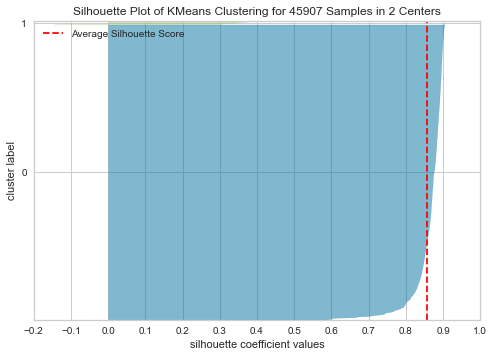

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 45907 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [51]:

# Clustering
kmeans = KMeans(n_clusters=2, random_state=1212).fit(df_normalized)
kmeans.labels_
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_normalized)        # Fit the data to the visualizer
visualizer.show()  

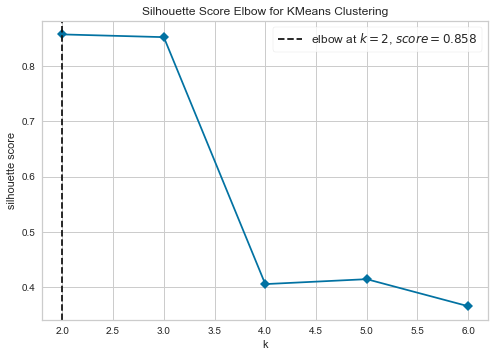

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [54]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(n_clusters= 2, random_state=1212).fit(df_normalized)
visualizer = KElbowVisualizer(model, k =(2,7), metric='silhouette', timings=False)

visualizer.fit(df_normalized)
visualizer.show()


In [ ]:
label_pca = kmeans.

In [60]:
fig = px.scatter(x=df_normalized[:, 2], y=df_normalized[:, 3], color=label_pca)
fig.show()

ValueError: All arguments should have the same length. The length of argument `color` is 6, whereas the length of  previously-processed arguments ['x', 'y'] is 45907

In [ ]:
# calcul distribué vs parralele:
# ex avec 3 workers 300m de lignes et 300 arbres
# Dist: DATA distribuée = 100M, arbres  = 300 (+-) 
# Parra: 300m , arbres = 100 chaque 